# Mapping Environmental Inequality: An Analysis of Environmental Burden and Deprivation in Glasgow

* **Authors:** Noe Fine

* **Student ID:** 210037459

* **Date:** 08/12/2025

**Abstract:**

Environmental justice research shows that environmental harms disproportionately affect marginalised communities. This project investigates whether these inequalities persist in Glasgow by examining the relationship between cumulative environmental burdens and socioeconomic deprivation. A Cumulative Environmental Burden Index (EBI) was created in QGIS using Multi-Criteria Evaluation, combining six factors: PM₂.₅, PM₁₀, NO₂, noise pollution, proximity to major roads, and distance from waste facilities. These values were linked to Scottish Index of Multiple Deprivation (SIMD) datazones through zonal statistics. Python analysis, including visualisation, K-means clustering, and Spearman correlation, was used to analyse spatial patterns.

Findings show that the most deprived areas consistently experience the highest environmental burdens, with clear hotspots across central and eastern Glasgow. K-means clustering reveals overlapping clusters of high deprivation and high EBI, while correlation analysis confirms a statistically significant relationship between the two. Overall, the study shows that environmental burdens in Glasgow are not randomly distributed but reflect deeper, long-standing patterns of systemic inequality, where social disadvantage and environmental risk reinforce one another.

**Keywords:** environmental justice, environmental burden, pollution, environmental inequality, Glasgow, Scotland, deprivation,

# GitHub Repository
- **GitHub Link:** https://github.com/noefine/Final_Research_Project

## Declaration

> In submitting this assignment, I hereby confirm that I have read the University's statement on Good Academic Practice. The following work is my own. Significant academic debts and borrowings have been properly acknowledged and referenced.


## **Table of Contents:**

- **1. Introduction**

- **2. Methodology**
  - 2.1 Study Area
  - 2.2 Data Sources
  - 2.3 QGIS
    - 2.3.1 MCE Construction to Calculate a Cumulative Environmental Burden Index (EBI)
      - 2.3.1.1 Factor 1: Distance to Major Roads
      - 2.3.1.2 Factor 2: NO₂ Levels
      - 2.3.1.3 Factor 3: PM₁₀ Levels
      - 2.3.1.4 Factor 4: PM₂.₅ Levels
      - 2.3.1.5 Factor 5: Waste Facility Proximity
      - 2.3.1.6 Factor 6: Noise Pollution
      - 2.3.1.7 Calculating the EBI using MCE
    - 2.3.2 Comparing Environmental Burden Index to SIMD
  - 2.4 Python

- **3. Results**
  - 3.1 Visual Comparison between SIMD and MCE Exposure Index
  - 3.2 K-Means Clustering
  - 3.3 Exploring Correlation using GeoPandas
  - 3.4 Bar Plot of Exposure by SIMD
  - 3.5 Boxplot of Exposure by SIMD
  - 3.6 Scatterplot with Regression Line
  - 3.7 Spearman's Rank Correlation Significance Test

- **4. Discussion**
  - 4.1 Visual Comparison of EBI and SIMD Maps
  - 4.2 Comparing Clusters of high EBI with clusters of deprivation
  - 4.3 EBI across Deprivation Gradient
  - 4.4 Quantifying the Relationship between Deprivation and Environmental Burden

- **5. Conclusion**

- **6. References**



## 1. Introduction

Environmental justice (EJ) research has long shown that environmental harms are not distributed evenly, but follow patterns of social, economic, and political inequality. Urban areas in particular tend to concentrate pollution, infrastructural burdens, and environmental risks in communities already experiencing socioeconomic disadvantage (Walker, 2012; Schlosberg, 2007). In Scotland, these issues have been documented for decades. Kevin Dunion’s Troublemakers: The Struggle for Environmental Justice in Scotland (2003) argues that environmental injustice in Scotland is deeply embedded in planning decisions, industrial geography, and political processes that have historically placed landfills, incinerators, major roads, and polluting industries near the poorest communities.

Building on this context, this project examines whether similar patterns are visible in contemporary Glasgow. Glasgow has long been characterised by stark socioeconomic divides, and previous studies have identified higher pollution levels and poorer environmental quality in its most deprived neighbourhoods (SPHO, 2005). The central question guiding this research is therefore: Are Glasgow’s most deprived communities most exposed to environmental burdens?

## 2. Methodology

I combined GIS spatial modelling with Python statistical analysis to find how socioeconomic deprivation relates to environmental burden. First, I used Multi-Criteria Evaluation (MCE) to combine multiple environmental stressors (air pollution, noise, road proximity, and waste facilities) into a cumulative Environmental Burden Index (EBI). Second, deprivation data from the Scottish Index of Multiple Deprivation (SIMD) was spatially joined to the EBI using zonal statistics in QGIS. Finally, the resulting dataset was analysed in Python to explore patterns of environmental inequality.


### 2.1 Study Area
I created a circular shapefile called Glasgow_Boundary that covers Glasgow City and the surrounding areas to use as the extent for all of the rasters and vectors I create.


### 2.2 Data Sources


*  **Scottish Index of Multiple Deprivation (SIMD):** A shapefile of Scotland showing areas classified by levels of deprivation, based on indicators such as income, employment, health, education, skills and training, access to services, crime, and housing in 2020 (Scottish Government, 2020)
*   **Roads:** A shapefile of roads in the area around Glasgow (Ordinance Survey, 2025)
*  **Air Pollution (PM₂.₅):** A CSV file of the average PM₂.₅ at 1km² resolution for 2024 (DEFRA, 2024)
*   **Air Pollution (PM₁₀):**  A CSV file of the average PM₁₀ at 1km² resolution for 2024 (DEFRA, 2024)
*   **Air Pollution (NO₂):**  A CSV file of the average NO₂ at 1km² resolution for 2024 (DEFRA, 2024)
*  **Waste Facilities:** Shapefile of waste sites in 2023 (SEPA, 2023)
*  **Noise Pollution:** A raster showing day-evening-night level (Lden), a noise indicator for overall annoyance based upon annual average A-weighted long-term sound over 24 hours with a 5 dB(A) penalty for evening noise (19:00-23:00) and a 10 dB(A) penalty for night-time noise (23:00-07:00).(UK Government, 2022)

### 2.3 QGIS

#### 2.3.1 MCE Construction to Calculate a Cumulative Environmental Burden Index (EBI)
I construct an EBI using Multi-Criteria Evaluation (MCE) in QGIS. The purpose of the EBI is to combine multiple environmental stressors (air pollution, noise levels, proximity to major roads, and distance from waste facilities) into a single measure of environmental harm.

In [57]:
# Mount Google Drive to access project files
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [58]:
# Import libraries to show screenshots in methodology section
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

##### 2.3.1.1 Factor 1: Distance to Major Roads

I imported the shapefile of roads to QGIS using the EPSG:27700 CRS. Then, I filtered the dataset to only include Motorways and A roads (major roads) and saved this new vector. I clipped the new vector to the extent of my Glasgow Boundaries shapefile to create a vector of the major roads in the Glasgow area. I converted this to a raster and used the proximity tool to calculate the distance from every location to the nearest major road. Lastly, I normalized the raster.

Text(0.5, 1.0, 'Figure 1: Proximity to Major Roads Raster')

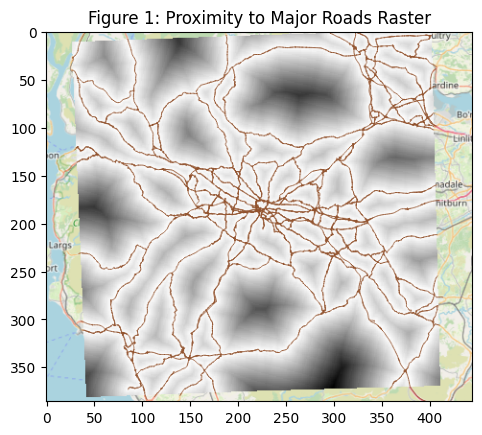

In [59]:
plt.imshow(mpimg.imread("/content/drive/MyDrive/Colab Notebooks/Research_Project/screenshots/Factor1_RoadsProximity.png"))
plt.title("Figure 1: Proximity to Major Roads Raster", fontsize=12)

##### 2.3.1.2 Factor 2: NO₂ Levels

I imported the NO₂ CSV file as a point layer in QGIS using the x and y coordinates and the EPSG:27700 CRS. I then exported this point layer as a shapefile to create a vector dataset. Using the Rasterize tool, I converted the vector points to a raster with 1×1 km cells, using the NO₂ values as the raster values, and clipped the raster to the extent of Glasgow. Lastly, I normalized this raster.

Text(0.5, 1.0, 'Figure 2: NO₂ Levels Raster')

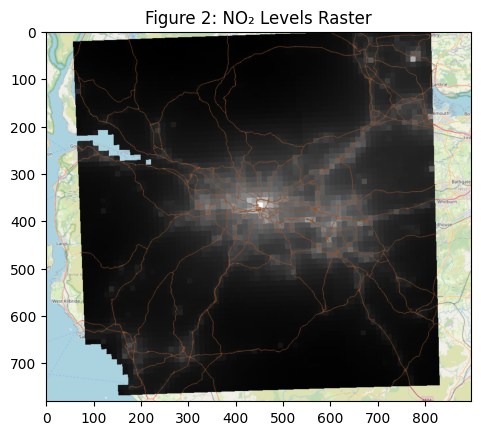

In [60]:
plt.imshow(mpimg.imread("/content/drive/MyDrive/Colab Notebooks/Research_Project/screenshots/Factor2_NO2.png"))
plt.title("Figure 2: NO₂ Levels Raster", fontsize=12)

##### 2.3.1.3 Factor 3: PM₁₀ Levels

I imported the PM₁₀ CSV file as a point layer in QGIS using the x and y coordinates and the EPSG:27700 CRS. I then exported this point layer as a shapefile to create a vector dataset. Using the Rasterize tool, I converted the vector points to a raster with 1×1 km cells, using the PM₁₀ values as the raster values, and clipped the raster to the extent of Glasgow. Lastly, I normalized this raster.

Text(0.5, 1.0, 'Figure 3: PM₁₀ Levels Raster')

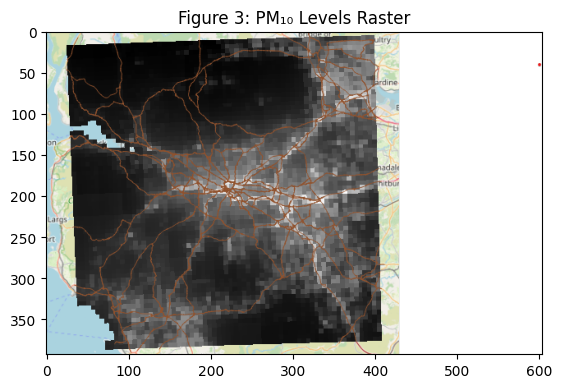

In [61]:
plt.imshow(mpimg.imread("/content/drive/MyDrive/Colab Notebooks/Research_Project/screenshots/Factor3_PM10.png"))
plt.title("Figure 3: PM₁₀ Levels Raster", fontsize=12)

##### 2.3.1.4 Factor 4: PM₂.₅ Levels

I imported the PM₂.₅ CSV file as a point layer in QGIS using the x and y coordinates and the EPSG:27700 CRS. I then exported this point layer as a shapefile to create a vector dataset. Using the Rasterize tool, I converted the vector points to a raster with 1×1 km cells, using the PM₂.₅ values as the raster values, and clipped the raster to the extent of Glasgow. Lastly, I normalized this raster to a 1-0 scale so that cells with higher PM₂.₅ levels show a higher environmental burden.

Text(0.5, 1.0, 'Figure 4: PM₂.₅ Levels Raster')

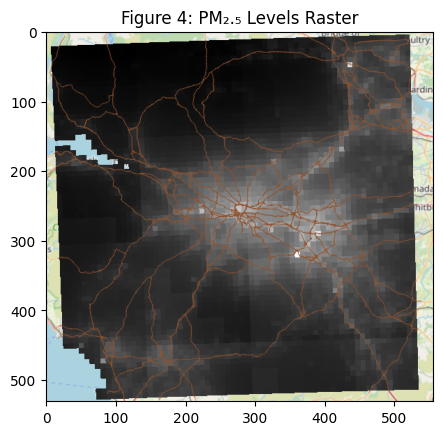

In [62]:
plt.imshow(mpimg.imread("/content/drive/MyDrive/Colab Notebooks/Research_Project/screenshots/Factor4_PM25.png"))
plt.title("Figure 4: PM₂.₅ Levels Raster", fontsize=12)

##### 2.3.1.5 Factor 5: Waste Facility Proximity

I first imported the point dataset of waste facility locations into QGIS and ensured it was correctly projected to the British National Grid (EPSG:27700). I then rasterized the point layer to the exent of my Glasgow boundary and used the proximity tool to create a raster where each cell records the distance to the nearest waste facility. Finally, I normalized this raster from its original 0–21,600 m range to a 1–0 scale so that cells closer to waste facilities represent higher environmental burden.

Text(0.5, 1.0, 'Figure 5: Waste Facilities Proximity Raster')

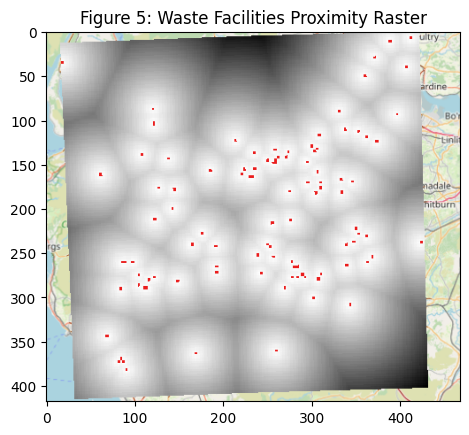

In [63]:
plt.imshow(mpimg.imread("/content/drive/MyDrive/Colab Notebooks/Research_Project/screenshots/Factor5_FacilityProximity.png"))
plt.title("Figure 5: Waste Facilities Proximity Raster", fontsize=12)

##### 2.3.1.6 Factor 6: Noise Pollution

I uploaded the raster of LDEN to QGIS and clipped it to the boundary of Glasgow. Then, I normalized the raster to a range of 1-0, so that areas with higher noise pollution are 1.


Text(0.5, 1.0, 'Figure 6: Noise Pollution Raster')

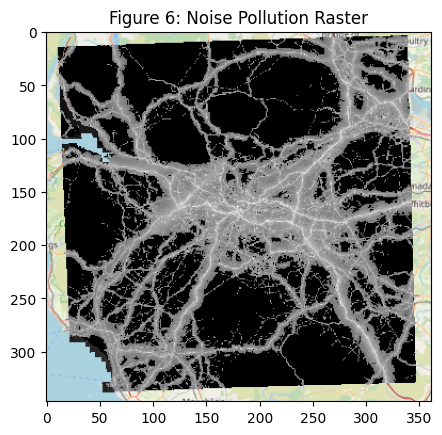

In [64]:
plt.imshow(mpimg.imread("/content/drive/MyDrive/Colab Notebooks/Research_Project/screenshots/Factor6_NoisePollution.png"))
plt.title("Figure 6: Noise Pollution Raster", fontsize=12)

##### 2.3.1.7 Calculating the EBI using MCE

I weighted the factors as follows:


*   Air Pollution (PM₂.₅) 30%
*   Air Pollution (PM₁₀) 15%
*   Air Pollution (NO₂) 15%
*   Roads (proximity to major roads) 10%
*   Waste Facilities (proximity) 10%
*   Noise Pollution (Lden) 20%

Air pollution is widely recognised as one of the most significant environmental determinants of health in urban settings. The WHO (2021) identifies fine particulate matter as responsible for the largest proportion of pollution-related morbidity and mortality worldwide, so PM₂.₅ is given the highest weight. Ferrier et al. (2018) also show that cumulative air pollution in UK cities strongly correlates with chronic respiratory illness, so PM₁₀ and NO₂ are given a weight of 15% because they add complementary information about urban pollution exposure.

The inclusion of proximity to major roads reflects evidence that both chemical  and non-chemical stressors (noise, vibration) cluster along transport corridors. Skudra et al. (2021) demonstrate that road-adjacent populations face disproportionately high cumulative exposures. However, to avoid double-counting these stressors, I assigned a lower wr=eight to road proximity than to direct pollutants. Noise pollution is also increasingly recognised as an environmental health concern. Stansfeld & Clark (2015) show that long-term noise exposure contributes to cardiovascular stress, sleep disruption, and decreased quality of life. Therefore, I assigned noise pollution a weight of 20%.

Finally, waste facilities were given a moderate weight because they tend to produce localised but potentially severe environmental impacts including odour, dust, and contaminants.. Bootsma et al. (2021) highlight how cumulative burdens near industrial and waste facilities compound existing health inequalities.

I used the raster calculator to create a raster of the Environmental Burden Index of Glasgow City.

Text(0.5, 1.0, 'Figure 7: Raster of Environmental Burden Index')

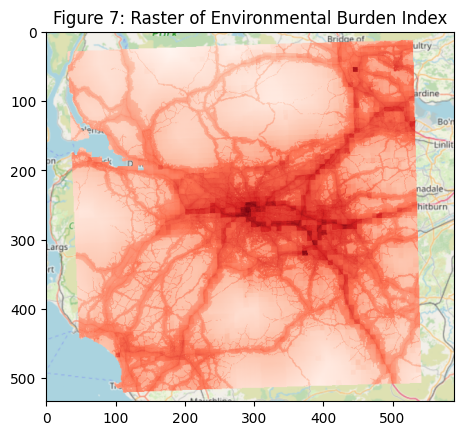

In [65]:
plt.imshow(mpimg.imread("/content/drive/MyDrive/Colab Notebooks/Research_Project/screenshots/ExposureIndexColour.png"))
plt.title("Figure 7: Raster of Environmental Burden Index", fontsize=12)

#### 2.3.2 Comparing Environmental Burden Index to SIMD

In order to explore how disadvantaged communities are disproportionately exposed to environmental burdens, I needed to compare the EBI to SIMD. I imported the SIMD 2020 datazones into QGIS, repaired invalid geometries to ensure they could be spatially analysed, and clipped the dataset to the Glasgow boundary. Using Zonal Statistics, I created a shapefile that added a field with the mean EBI value of each data zone to the SIMD data. This allows deprivation levels to be directly compared with environmental burden for each SIMD datazone. I converted this shapefile into two rasters: one representing SIMD quintile ranks (five groups from most (1) to least (5) deprived) and one representing mean EBI values so that both datasets could be compared visually to examine patterns of environmental inequality. These can be seen in the results section (part 3.1). I also converted the shapefile into a csv file to be used for future python visualization and analysis.

### 2.4 Python

I used python to extend the analysis conducted in QGIS by enabling additional statistical exploration, data manipulation, and visualisation of the Environmental Burden Index (EBI) relative to SIMD deprivation data.

To start, I exported the zonal statistics results from QGIS as two shapefiles and a CSV file. I loaded the datasets using pandas and geopandas. These libraries allowed the SIMD attributes and the mean EBI values to be subsetted and cleaned for analysis. Geopandas enabled spatial clustering and interactive mapping. Using scikit-learn, I performed K-Means clustering to identify distinct groups of high, medium, and low environmental burden and deprivation in Glasgow. Then, I created an interactive map using geopandas.explore() to visually examine geographic patterns. I also used Matplotlib and seaborn to generate bar plots, boxplots, scatterplots, and regression lines. These visualisations helped illustrate patterns and variability of EBI across deprivation groups. Lastly, I calculated Spearman’s rank correlation and p-value between SIMD and EBI using scipy.

## 3. Results


### 3.1 Visual Comparison between SIMD and EBI from QGIS
Below are my two results from the MCE. Looking at them both, you can visually see how exposures to environmental risks and levels of deprivation correlate.

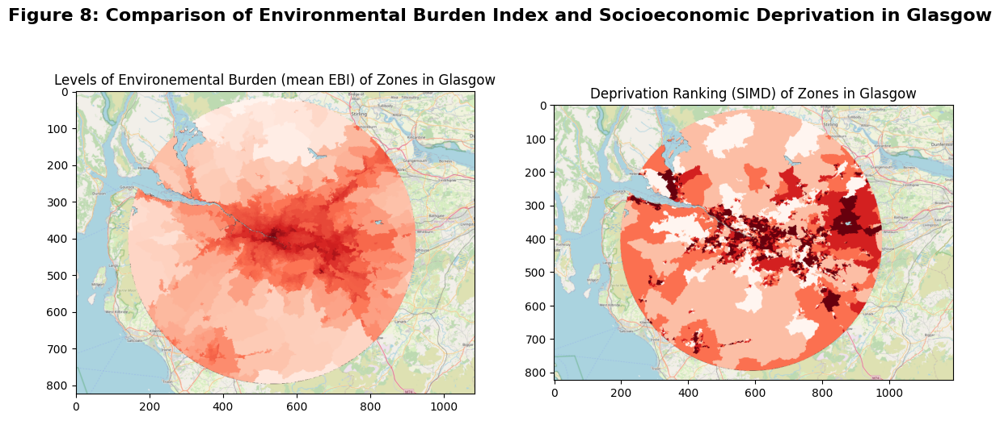

In [66]:
fig, ax = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle("Figure 8: Comparison of Environmental Burden Index and Socioeconomic Deprivation in Glasgow",
             fontsize=16, fontweight='bold')
# Load raster of levels of exposure
img1 = mpimg.imread("/content/drive/MyDrive/Colab Notebooks/Research_Project/screenshots/Final_Exposure.png")
ax[0].imshow(img1)
ax[0].set_title("Levels of Environemental Burden (mean EBI) of Zones in Glasgow", fontsize=12)

# Load raster of SIMD levels
img2 = mpimg.imread("/content/drive/MyDrive/Colab Notebooks/Research_Project/screenshots/Final_SIMD.png")
ax[1].imshow(img2)
ax[1].set_title("Deprivation Ranking (SIMD) of Zones in Glasgow", fontsize=12)

plt.show()

### 3.2 K-Means Clustering
K-Means clustering was used to reveal grouping patterns in the data that are not visible in the final EBI and SIMD rasters alone. Figure 8 does not identify whether these values form distinct clusters of high, medium, or low vulnerability. K-Means groups datazones with similar exposure or deprivation levels, allowing these patterns to be mapped more clearly.

In [67]:
# Import necessary libraries for project
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans


In [68]:
# Load the SIMD and environmental exposure shapefile
ExposureBySIMD_gdf = gpd.read_file('/content/drive/MyDrive/Colab Notebooks/Research_Project/data/SIMD_Exposure_Index.shp')
ExposureBySIMD_gdf.head()

,fid,DataZone,DZName,LAName,SAPE2017,WAPE2017,Rankv2,Quintilev2,Decilev2,Vigintilv2,...,CrimeRank,HouseNumOC,HouseNumNC,HouseOCrat,HouseNCrat,HouseRank,Shape_Leng,Shape_Area,exposure_m,geometry
0,882.0,S01007387,Helensburgh North - 01,Argyll and Bute,692.0,391.0,6675.0,5.0,10.0,20.0,...,6574.0,12.0,3.0,2%,0%,6763.0,4672.752969,529940.527863,0.345381,"MULTIPOLYGON (((229885.756 683069.552, 229876 ..."
1,883.0,S01007388,Helensburgh North - 02,Argyll and Bute,652.0,386.0,6522.0,5.0,10.0,19.0,...,6928.0,23.0,5.0,3%,1%,6113.0,2806.766310,218259.476102,0.327503,"POLYGON ((230227.685 683556.978, 230225.297 68..."
2,884.0,S01007389,Helensburgh North - 03,Argyll and Bute,564.0,356.0,3429.0,3.0,5.0,10.0,...,3173.0,49.0,5.0,8%,1%,4008.0,2090.952053,170525.433424,0.278699,"POLYGON ((231564 683132, 231530 683000, 231550..."
3,885.0,S01007390,Helensburgh North - 04,Argyll and Bute,539.0,353.0,3531.0,3.0,6.0,11.0,...,2580.0,54.0,0.0,9%,0%,3918.0,1738.553903,136787.696076,0.321877,"POLYGON ((231220 682904, 231245 682853, 231256..."
4,886.0,S01007391,Helensburgh North - 05,Argyll and Bute,534.0,319.0,6819.0,5.0,10.0,20.0,...,5614.0,10.0,1.0,2%,0%,6766.0,5779.784640,640606.010076,0.251150,"POLYGON ((231854 683534, 231560 683201, 231532..."


In [69]:
# Subset with only relevant variables
ExposureBySIMD_gdf = ExposureBySIMD_gdf[["fid","DataZone","DZName","LAName", "Rankv2", "Quintilev2",	"Decilev2",	"Vigintilv2",	"exposure_m", "geometry"]]

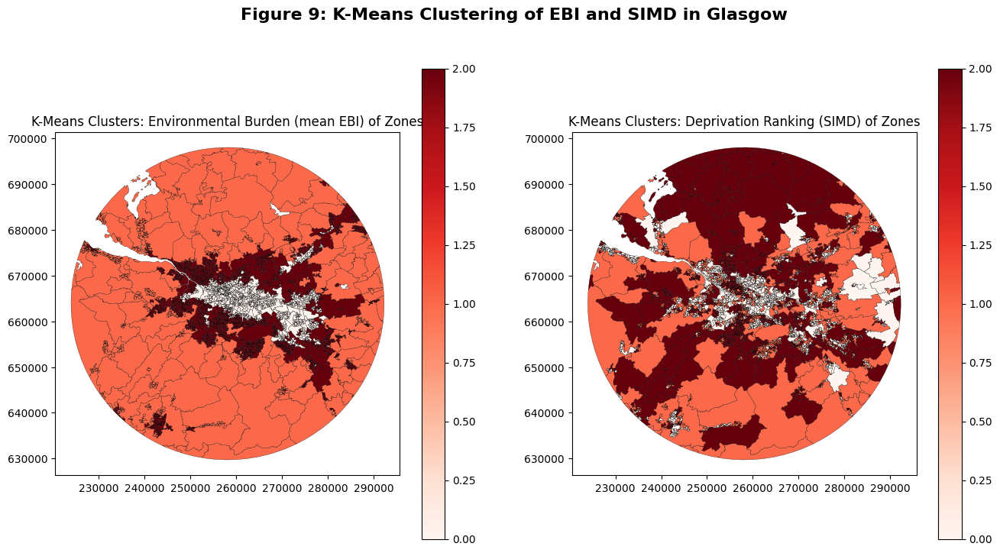

In [70]:
kmeans_exp = KMeans(n_clusters=3, random_state=42)
ExposureBySIMD_gdf["cluster_exposure"] = kmeans_exp.fit_predict(
    ExposureBySIMD_gdf[["exposure_m"]].values
)

# Cluster deprivation only
kmeans_simd = KMeans(n_clusters=3, random_state=42)
ExposureBySIMD_gdf["cluster_simd"] = kmeans_simd.fit_predict(
    ExposureBySIMD_gdf[["Rankv2"]].values
)

fig, ax = plt.subplots(1, 2, figsize=(16, 8))
fig.suptitle("Figure 9: K-Means Clustering of EBI and SIMD in Glasgow",
             fontsize=16, fontweight='bold')
# Environmental burden
ExposureBySIMD_gdf.plot(
    column="cluster_exposure",
    cmap="Reds",
    legend=True,
    ax=ax[0],
    edgecolor="black",
    linewidth=0.2
)
ax[0].set_title("K-Means Clusters: Environmental Burden (mean EBI) of Zones")

# SIMD deprivation
ExposureBySIMD_gdf.plot(
    column="cluster_simd",
    cmap="Reds",
    legend=True,
    ax=ax[1],
    edgecolor="black",
    linewidth=0.2
)
ax[1].set_title("K-Means Clusters: Deprivation Ranking (SIMD) of Zones")

plt.show()

### 3.3 Exploring correlation using GeoPandas
This interactive map uses the SIMD and Exposure shapefile I created in QGIS in part 2.3.8. I created this to easily visually inspect geographic patterns of deprivation and environmental burden.

In [71]:
# Create the interactive plot
ExposureBySIMD_gdf.explore()

### 3.4 Bar plot of exposure by SIMD
This bar plot illustrates how exposure to environmental risks varies across levels of deprivation, by comparing the mean exposure index of an SIMD region with the SIMD vigintile. SIMD vigintiles divide areas into twenty equal-sized groups, ranging from 1 (most deprived) to 20 (least deprived),

In [72]:
# Load the SIMD and exposure dataset I created in QGIS in part 2.3.8
ExposureBySIMD_df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Research_Project/data/SIMD_Exposure_Index.csv")
# Display first few rows to confirm the dataset loaded correctly
ExposureBySIMD_df.head()

,fid,DataZone,DZName,LAName,SAPE2017,WAPE2017,Rankv2,Quintilev2,Decilev2,Vigintilv2,...,CrimeRate,CrimeRank,HouseNumOC,HouseNumNC,HouseOCrat,HouseNCrat,HouseRank,Shape_Leng,Shape_Area,exposure_m
0,882,S01007387,Helensburgh North - 01,Argyll and Bute,692,391,6675,5,10,20,...,0,6574.0,12,3,2%,0%,6763.0,4672.752969,529940.527863,0.345381
1,883,S01007388,Helensburgh North - 02,Argyll and Bute,652,386,6522,5,10,19,...,0,6928.0,23,5,3%,1%,6113.0,2806.766310,218259.476102,0.327503
2,884,S01007389,Helensburgh North - 03,Argyll and Bute,564,356,3429,3,5,10,...,215,3173.0,49,5,8%,1%,4008.0,2090.952053,170525.433424,0.278699
3,885,S01007390,Helensburgh North - 04,Argyll and Bute,539,353,3531,3,6,11,...,263,2580.0,54,0,9%,0%,3918.0,1738.553903,136787.696076,0.321877
4,886,S01007391,Helensburgh North - 05,Argyll and Bute,534,319,6819,5,10,20,...,76,5614.0,10,1,2%,0%,6766.0,5779.784640,640606.010076,0.251150


In [73]:
# Subset ExposureBySIMD_df so it only contains relevant columns
ExposureBySIMD_df = ExposureBySIMD_df[["fid","DataZone","DZName","LAName", "Rankv2", "Quintilev2",	"Decilev2",	"Vigintilv2",	"exposure_m"]]
# Display the first few rows to make sure the Dataframe was subsetted correctly
ExposureBySIMD_df.head()

,fid,DataZone,DZName,LAName,Rankv2,Quintilev2,Decilev2,Vigintilv2,exposure_m
0,882,S01007387,Helensburgh North - 01,Argyll and Bute,6675,5,10,20,0.345381
1,883,S01007388,Helensburgh North - 02,Argyll and Bute,6522,5,10,19,0.327503
2,884,S01007389,Helensburgh North - 03,Argyll and Bute,3429,3,5,10,0.278699
3,885,S01007390,Helensburgh North - 04,Argyll and Bute,3531,3,6,11,0.321877
4,886,S01007391,Helensburgh North - 05,Argyll and Bute,6819,5,10,20,0.251150


/tmp/ipython-input-1427925858.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=ExposureBySIMD_df, x="Vigintilv2", y="exposure_m", palette="Reds_r")


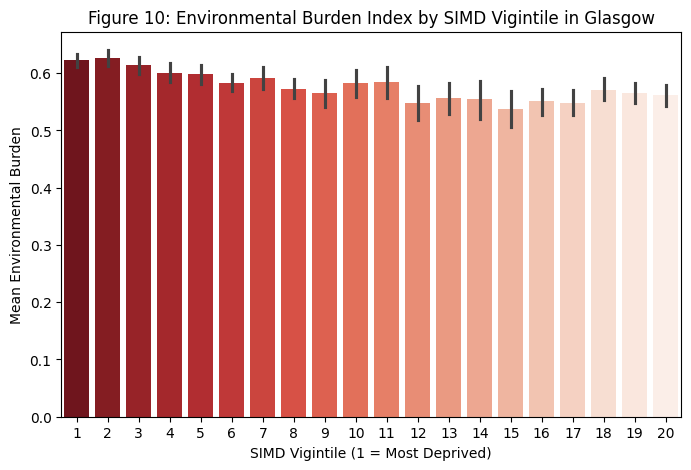

In [74]:
# Create Bar Plot
plt.figure(figsize=(8,5))
sns.barplot(data=ExposureBySIMD_df, x="Vigintilv2", y="exposure_m", palette="Reds_r")
plt.title("Figure 10: Environmental Burden Index by SIMD Vigintile in Glasgow")
plt.xlabel("SIMD Vigintile (1 = Most Deprived)")
plt.ylabel("Mean Environmental Burden")
plt.show()

### 3.5 Boxplot of exposure by SIMD
While bar plots summarise mean exposure, boxplots reveal the full distribution of environmental burdens within each deprivation group. The boxplot below uses SIMD quintiles to show patterns of variability.

/tmp/ipython-input-125480709.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=ExposureBySIMD_df, x="Quintilev2", y="exposure_m", palette="Reds_r")


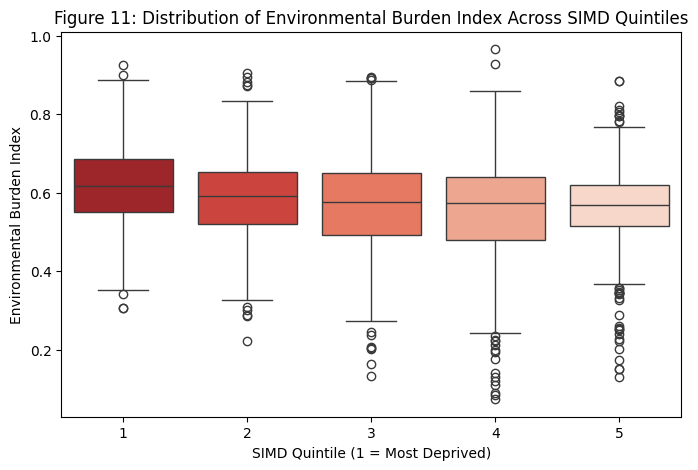

In [75]:
# Create Boxplot
plt.figure(figsize=(8,5))
sns.boxplot(data=ExposureBySIMD_df, x="Quintilev2", y="exposure_m", palette="Reds_r")
plt.title("Figure 11: Distribution of Environmental Burden Index Across SIMD Quintiles")
plt.xlabel("SIMD Quintile (1 = Most Deprived)")
plt.ylabel("Environmental Burden Index")
plt.show()

### 3.6 Scatterplot with regression line of exposure by SIMD
To quantify the strength and direction of the relationship between deprivation and environmental burden, I created a scatterplot with a regression line. Each point represents a single SIMD datazone, plotted using its overall SIMD rank and mean EBI

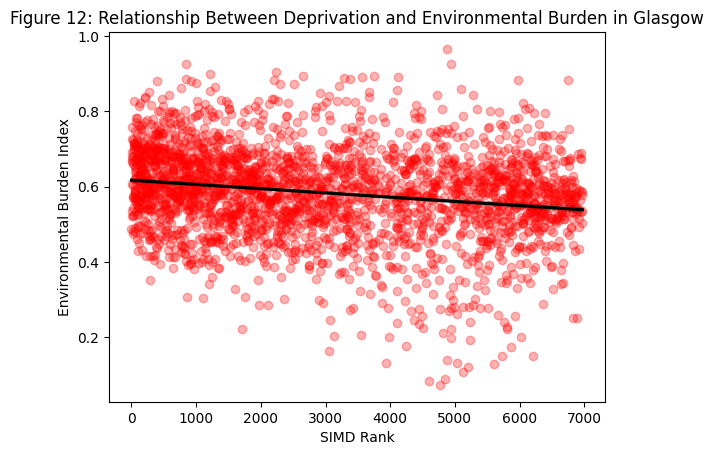

In [76]:
sns.regplot(
    data=ExposureBySIMD_df,
    x="Rankv2",
    y="exposure_m",
    scatter_kws={"alpha": 0.3, "color":"red"},
    line_kws={"color": "black"}
)
plt.title("Figure 12: Relationship Between Deprivation and Environmental Burden in Glasgow")
plt.xlabel("SIMD Rank")
plt.ylabel("Environmental Burden Index")
plt.show()

### 3.7 Spearman's Rank Correlation Significance Test
After visualising patterns using bar charts, boxplots, and scatterplots, it is important to formally quantify whether the observed relationship deprivation and environmental burden is statistically meaningful. Therefore I calculated the Spearman's rank correlation and p-value. I used Spearman's rank correlation rather than Pearson's correlation because SIMD rank is an ordial measure.

Although SciPy was not taught in the module, I used the spearmanr function because I found that it provides the correlation coefficient and associated significance level in a single calculation.

In [77]:
# Import spearmanr
from scipy.stats import spearmanr

# Calculate Spearman correlation and p-value
corr_coeff, p_value = spearmanr(ExposureBySIMD_df["Rankv2"],
                                ExposureBySIMD_df["exposure_m"])

# Show reults
print(f"Spearman Correlation: {corr_coeff:.4f}")
print(f"P-value: {p_value:.4f}")

Spearman Correlation: -0.2058
P-value: 0.0000


## 4. Discussion


### 4.1 Visual Comparison of EBI and SIMD Maps
Figure 8 compares the Environmental Burden Index (EBI) produced through the MCE with SIMD deprivation ranks across Glasgow. The visual overlap between the maps shows that zones experiencing high environmental burden (darker red areas on the left) appear in many of the same regions as highly deprived zones (darker red areas on the right), particularly along the Clyde corridor and eastern Glasgow. This aligns with existing literature that deprived communities are disproportionately located near pollution sources, major transport corridors, and industrial activity (SPHO, 2005; Mitchell & Dorling 2003).


### 4.2 Comparing Clusters of high EBI with clusters of deprivation
Figure 9 uses K-means clustering to identify groups of zones with similar levels of environmental burden (left) and deprivation (right). This figure highlights structural “hotspots.” The high-EBI cluster overlaps with the high-deprivation cluster. Particularly central-eastern Glasgow forms a concentrated high-burden, high-deprivation cluster. This mirrors national EJ concerns documented in The Scottish Public Health Observatory’s 2005 EJ Report. Further, the overlap of these clusters reinforce Walker’s (2012) argument that environmental inequalities are geographically patterned and reproduced through planning, infrastructure, and historical land-use decisions.

### 4.3 EBI across Deprivation Gradient
The bar chart in Figure 10 shows a slight decline in mean EBI across SIMD vigintiles: more deprived groups (1–5) face higher environmental burdens than less deprived groups (16–20). Again, this mirrors widely observed environmental inequalities in Scotland, where deprived communities are more exposed to traffic emissions, industrial noise, and waste infrastructure (SHPO, 2005)

The boxplot in Figure 11 adds nuance by showing the spread of EBI values within each SIMD quintile. While deprived zones have higher median EBI, they also show greater internal variability, suggesting that some deprived areas face extremely high environmental risks while others are moderately affected. This heterogeneity aligns with Schlosberg’s (2007) point that environmental justice must address both distributional and recognitional dimensions, recognising that different communities experience vulnerability in uneven ways.

### 4.4 Quantifying the Relationship between Deprivation and Environmental Burden

The scatterplot in Figure 12 shows a negative relationship between SIMD rank and EBI: as deprivation increases (lower rank), the environmental burden index increases. While the trend is modest, it is reinforced by the Spearman correlation coefficient of  -0.2058 and p-value of 0.0000. This indicates a statistically significant relationship.

## 5. Conclusion

Overall, my results consistently found that more deprived neighborhoods of Glasgow are exposed to higher levels of environmental risks. Those that are most deprived are also least able to relocate or meaningfully influence planning decisions, making these results particularly alarming (Mitchell & Dorling, 2003). The broader significance lies in how these patterns illuminate the structural processes that distribute environmental risks unevenly across urban space. This aligns with wider EJ scholarship arguing that issues of inequality cannot be separated from histories of land use, governance, and uneven development. In this sense, the project demonstrates how environmental risk is inseparable from broader questions of spatial justice.

Additionally, Mitchell & Dorling (2003) argue that addressing environmental inequality requires more than documenting disparities; it requires strengthening public rights to information, participation, and justice. Tools such as the Environmental Burden Index can help make inequalities visible and actionable. Future research should explore not only where inequalities occur, but how communities participate in shaping the environments in which they live.

Ultimately, this project highlights the importance of bringing environmental justice perspectives into urban planning and public health decision-making. By making patterns of inequality visible and analytically tractable, spatial tools such as the EBI can support more equitable, community-informed responses to environmental risk in Glasgow and beyond.

## 6. References




Bootsma, J.E. et al. (2021) Urban air pollution and cumulative respiratory health burdens: A spatial assessment. The Lancet Respiratory Medicine. Available via EBSCOhost at: https://research-ebsco-com.ezproxy.st-andrews.ac.uk/c/twg5t6/search/details/6xlknrithv

Department for Environment, Food & Rural Affairs (2024) UK-AIR: Modelled background pollution data (PCM) download page. Available at: https://uk-air.defra.gov.uk/data/pcm-data

Dunion, K. (2003) Troublemakers: The Struggle for Environmental Justice in Scotland. Edinburgh: Edinburgh University Press.

Ferrier, G.D. et al. (2018) Cumulative Exposure to Air Pollution in Urban Environments. MDPI Preprints / UCL Open Environment. Available at: https://www.mdpi.com/2305-6703/2/1/8

Mitchell, R. & Dorling, D. (2003) ‘An environmental justice analysis of British air quality’, Environment and Planning A, 35(5), pp. 909–929. Available at: https://journals.sagepub.com/doi/10.1068/a35240

Ordnance Survey (2025) OS Open Roads. Available at: https://osdatahub.os.uk/downloads/open/OpenRoads

Schlosberg, D. (2007) Defining Environmental Justice: Theories, Movements, and Nature. Oxford: Oxford University Press. Available at: https://academic.oup.com/book/4798

Scottish Environment Protection Agency (2023) Waste Site Capacity — Waste facility dataset. Available at: https://informatics.sepa.org.uk/WasteSiteCapacity/

Scottish Government (2020) Scottish Index of Multiple Deprivation (SIMD) 2020 data — Spatial data download catalogue. Available at:
https://www.spatialdata.gov.scot/geonetwork/srv/eng/catalog.search#/metadata/02866b0b-66e5-46ab-9b1c-d433dc3c2fae

Scottish Public Health Observatory (ScotPHO) (2005) Environmental Justice in Scotland: Evidence of Inequality and the Implications for Public Policy. Available at: https://www.scotpho.org.uk/wider-determinants/physical-environment/data/environmental-justice/

Skudra, I. et al. (2021) Environmental inequality and proximity to pollution sources: a spatial analysis of road traffic exposure. Environmental Monitoring and Assessment, 193(2). Available at: https://link-springer-com.ezproxy.st-andrews.ac.uk/article/10.1007/s10661-021-09535-8

Stansfeld, S. & Clark, C. (2015) ‘Health effects of noise exposure in Children’, Encyclopedia of Environmental Health, pp. 683–690. Available at: https://pubmed.ncbi.nlm.nih.gov/26231366/

UK Government (2022) Explaining the 2022 Noise Maps — Strategic noise mapping 2022. Available at: https://www.gov.uk/government/publications/strategic-noise-mapping-2022/explaining-the-2022-noise-maps

Walker, G. (2012) Environmental Justice: Concepts, Evidence and Politics. Abingdon: Routledge.

World Health Organization (WHO) (2021) Air Quality Guidelines: Global Update 2021. WHO Regional Office for Europe. Available at: https://www.who.int/publications/i/item/9789240034228